In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

## **1. Blending & Pasting**

In [2]:
img1 = cv2.imread("./data/dog_backpack.png")
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)

img2 = cv2.imread("./data/watermark_no_copy.png")
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

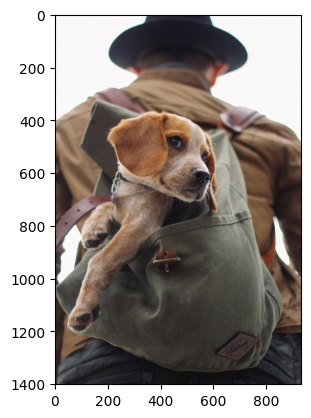

In [3]:
plt.imshow(img1)
plt.show()

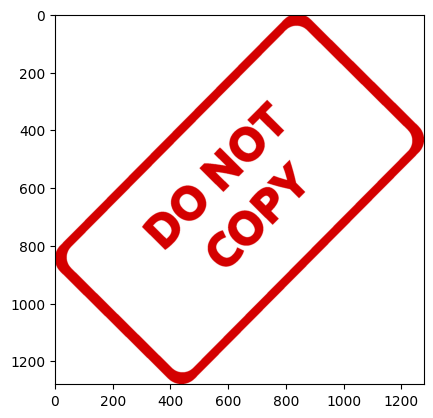

In [4]:
plt.imshow(img2)
plt.show()

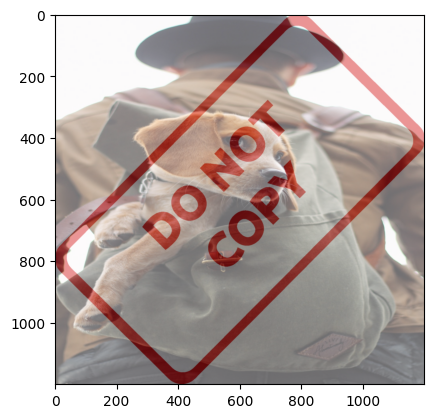

In [5]:
# Blending images of the same size.
img1 = cv2.resize(img1, (1200, 1200))
img2 = cv2.resize(img2, (1200, 1200))

# blend  = img1 * alpha + img2 * beta + gamma
blend = cv2.addWeighted(src1=img1, alpha=0.6, src2=img2, beta=0.4, gamma=0)
plt.imshow(blend)
plt.show()

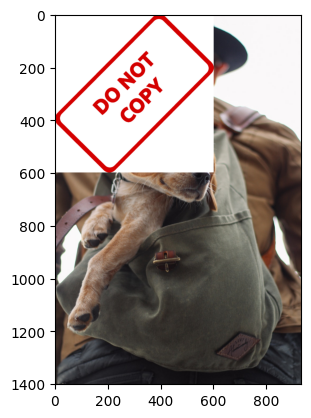

In [6]:
# Put small image on top of a larger image (no blending).
img1 = cv2.imread("./data/dog_backpack.png")
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)

img2 = cv2.imread("./data/watermark_no_copy.png")
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
img2 = cv2.resize(img2, (600, 600))

img1[0 : img2.shape[1], 0 : img2.shape[0]] = img2
plt.imshow(img1)
plt.show()

## **2. Masking**

In [7]:
img1 = cv2.imread("./data/dog_backpack.png")
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)

img2 = cv2.imread("./data/watermark_no_copy.png")
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
img2 = cv2.resize(img2, (600, 600))

img1.shape, img2.shape

((1401, 934, 3), (600, 600, 3))

In [8]:
ymin, xmin = np.asarray(img1.shape[:2]) - np.asarray(img2.shape[:2])
ymax, xmax = img1.shape[:2]

xmin, ymin, xmax, ymax

(334, 801, 934, 1401)

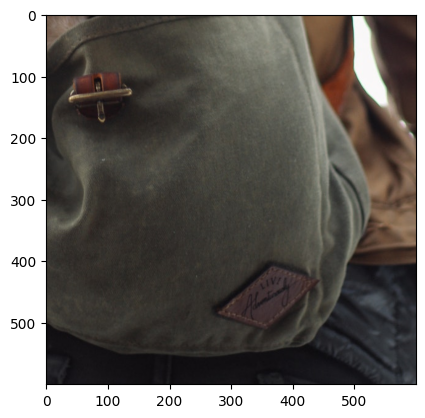

In [9]:
region_of_interest = img1[ymin:ymax, xmin:xmax]
plt.imshow(region_of_interest)
plt.show()

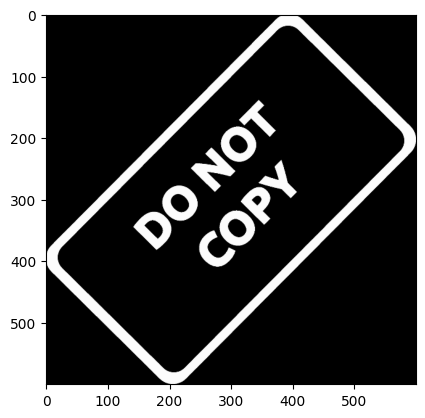

In [10]:
mask = cv2.bitwise_not(cv2.cvtColor(img2, cv2.COLOR_RGB2GRAY))
plt.imshow(mask, cmap="gray")
plt.show()


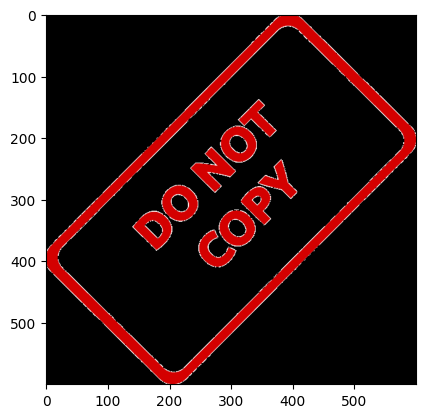

In [11]:
foreground = cv2.bitwise_or(img2, img2, mask=mask)
plt.imshow(foreground)
plt.show()

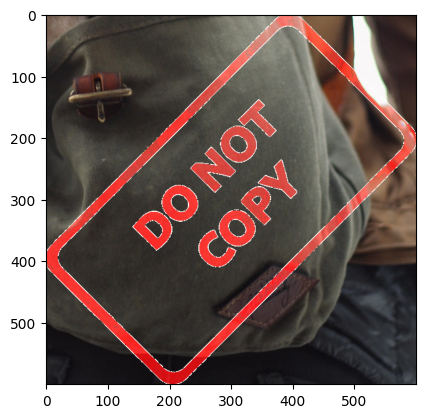

In [12]:
final_roi = cv2.bitwise_or(region_of_interest, foreground)
plt.imshow(final_roi)
plt.show()

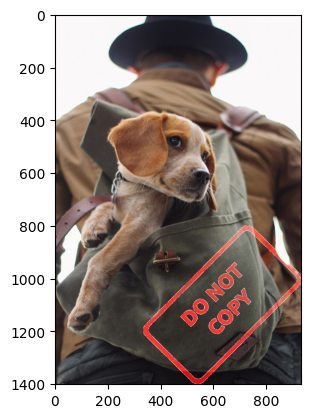

In [13]:
final_img = img1.copy()
final_img[ymin:ymax, xmin:xmax] = final_roi
plt.imshow(final_img)
plt.show()

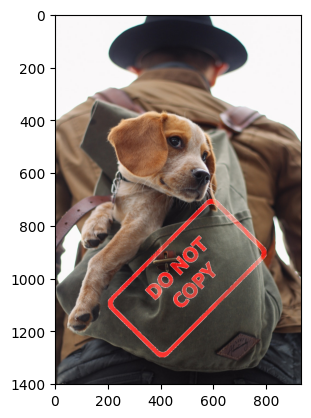

In [14]:
def overlay(img1, img2, *, xc, yc):
    h, w = img2.shape[:2]
    ymin, ymax = yc - h // 2, yc + h // 2
    xmin, xmax = xc - w // 2, xc + w // 2
    region_of_interest = img1[ymin:ymax, xmin:xmax]

    mask = cv2.bitwise_not(cv2.cvtColor(img2, cv2.COLOR_RGB2GRAY))
    foreground = cv2.bitwise_or(img2, img2, mask=mask)
    region_of_interest = cv2.bitwise_or(region_of_interest, foreground)

    result = img1.copy()
    result[ymin:ymax, xmin:xmax] = region_of_interest
    return result


a = overlay(img1, img2, xc=500, yc=1000)
plt.imshow(a)
plt.show()

## **3. Thresholding**

Image thresholding is a technique that simplifies a grayscale image into a binary image by classifying each pixel value as either black or white based on its intensity level or gray-level compared to the threshold value

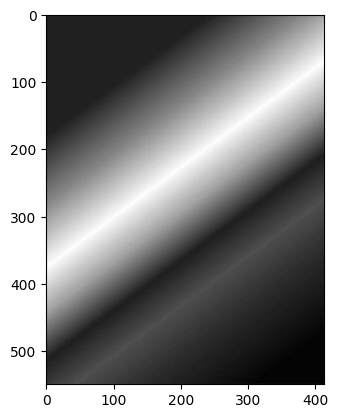

In [15]:
img = cv2.imread("./data/rainbow.jpg", cv2.IMREAD_GRAYSCALE)
plt.imshow(img, cmap="gray")
plt.show()

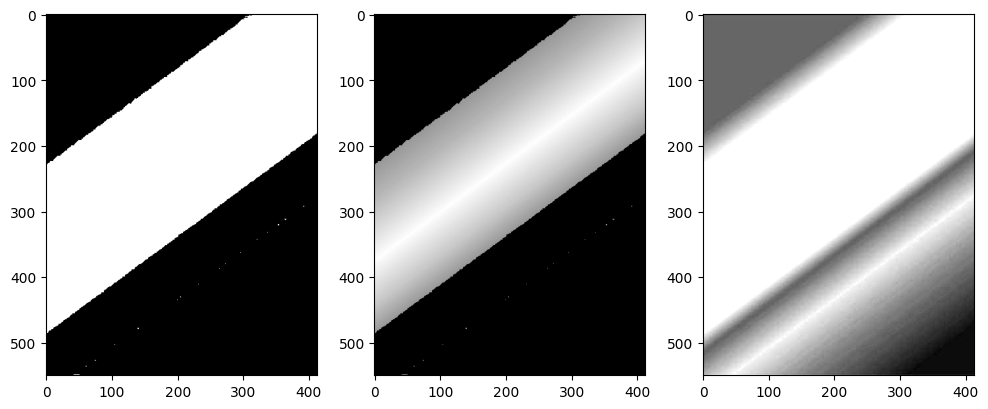

In [16]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, tight_layout=True, figsize=(10, 5))

ret, img_thresh = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)
ax1.imshow(img_thresh, cmap="gray")
ret, img_thresh = cv2.threshold(img, 127, 255, cv2.THRESH_TOZERO)
ax2.imshow(img_thresh, cmap="gray")
ret, img_thresh = cv2.threshold(img, 127, 255, cv2.THRESH_TRUNC)
ax3.imshow(img_thresh, cmap="gray")
plt.show()

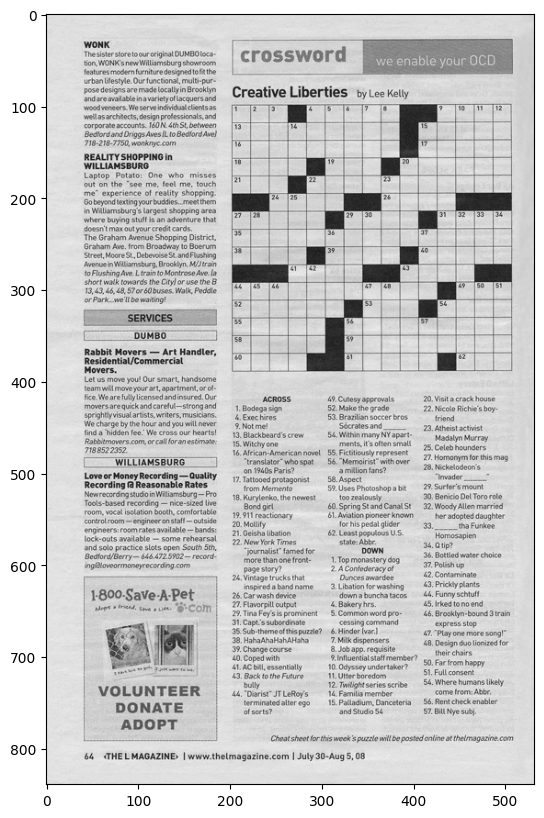

In [17]:
img = cv2.imread("./data/crossword.jpg", cv2.IMREAD_GRAYSCALE)
plt.figure(figsize=(10, 10))
plt.imshow(img, cmap="gray")
plt.show()

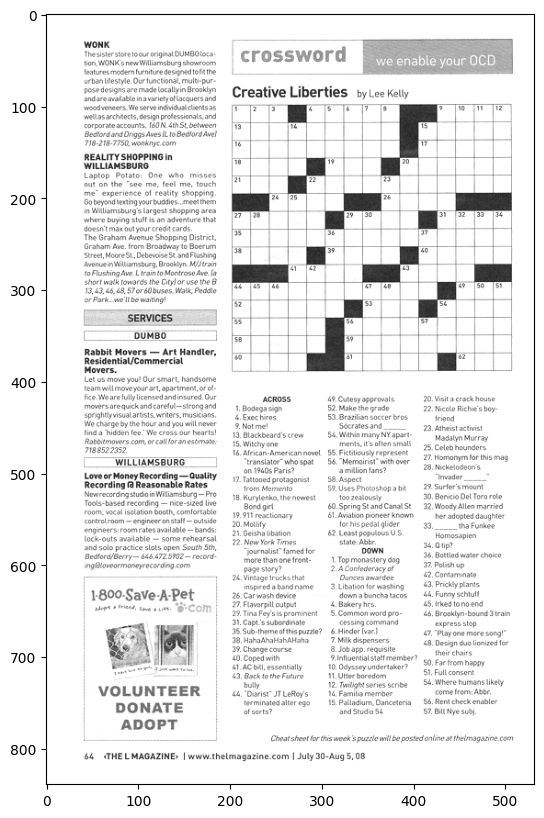

In [18]:
ret, img_thresh = cv2.threshold(img, 200, 255, cv2.THRESH_TRUNC)
plt.figure(figsize=(10, 10))
plt.imshow(img_thresh, cmap="gray")
plt.show()

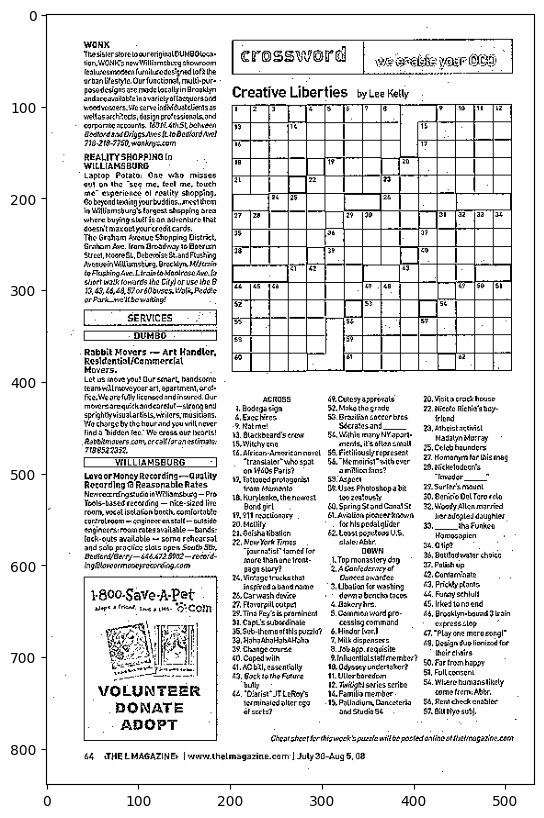

In [19]:
img_thresh = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 5, 10)
plt.figure(figsize=(10, 10))
plt.imshow(img_thresh, cmap="gray")
plt.show()

## **4. Blurring & Smoothing**

Blurring (smoothing) an image can help get rid of noise, or help an application focus on general details. Often this operation is combined with edge detection, since edge detection algorithms detect too many edges when shown a high resolution image without any blurring. Blurring is nothing more than applying a kernel onto image. For example, for each 3x3 block of pixels in the original image, we multiply each pixel by the corresponding entry of the kernel and then take the sum. That sum becomes a new pixel in the new image. See image kernels: https://setosa.io/ev/image-kernels/

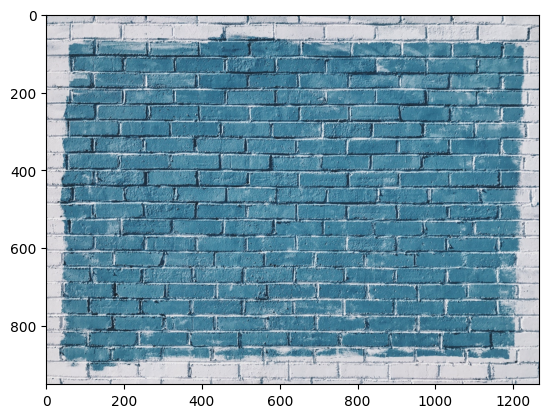

In [20]:
img = cv2.imread("./data/bricks.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.show()

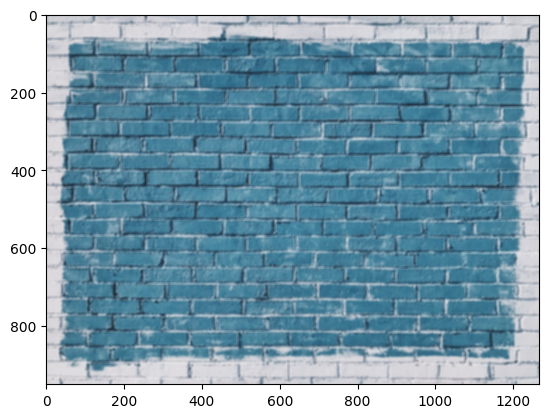

In [21]:
# Manual blurring with a given kernel.
kernel = np.ones((7, 7), np.float32) / 49
blur = cv2.filter2D(img, -1, kernel)
plt.imshow(blur)
plt.show()

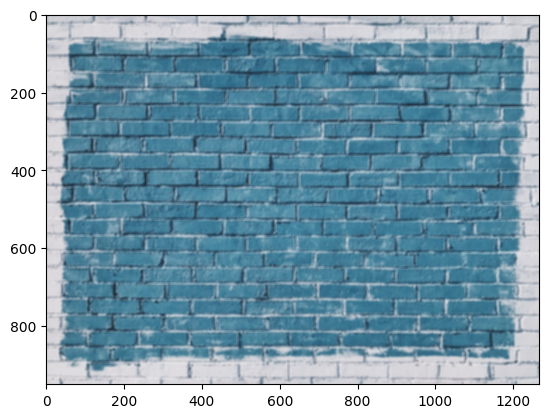

In [22]:
# Built-in blurring function.
blur = cv2.blur(img, (7, 7))
plt.imshow(blur)
plt.show()

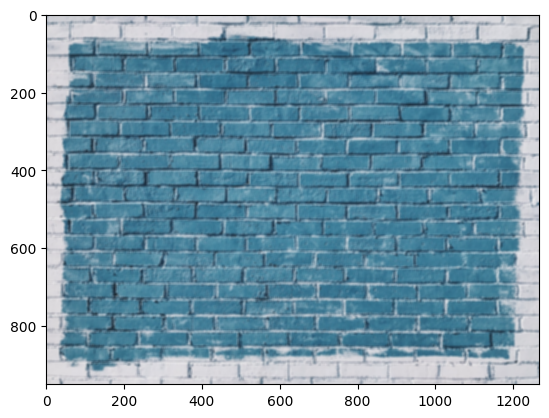

In [23]:
# Gaussian blur with a given kernel size and sigma.
gblur = cv2.GaussianBlur(img, (7, 7), sigmaX=10, sigmaY=10)
plt.imshow(gblur)
plt.show()

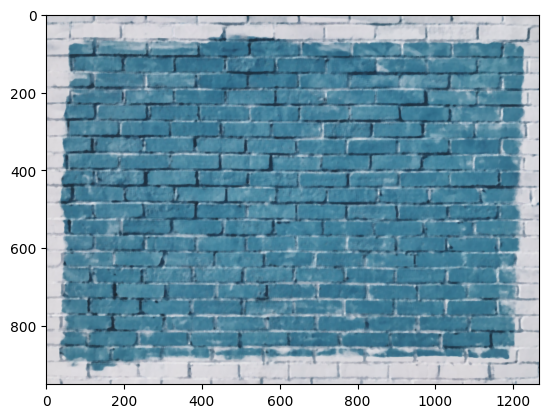

In [24]:
# Median blur - good for removing salt-and-pepper noise.
mblur = cv2.medianBlur(img, 7)
plt.imshow(mblur)
plt.show()

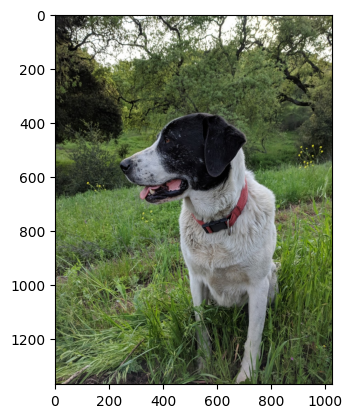

In [25]:
img = cv2.imread("./data/sammy.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.show()

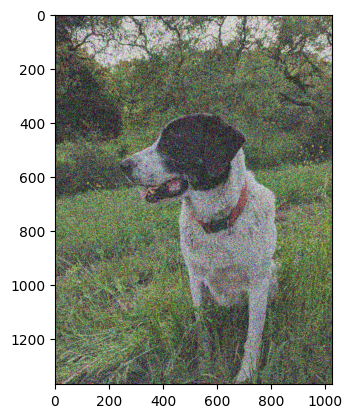

In [26]:
np.random.seed(42)
gaussian_noise = np.random.normal(0, 1, size=img.shape) * 127
noisy_img = np.clip(img + gaussian_noise, 0, 255).astype(np.uint8)  # type: ignore
plt.imshow(noisy_img)
plt.show()

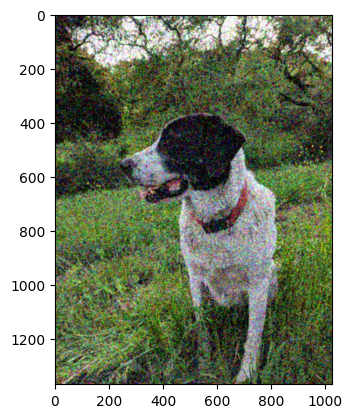

In [27]:
mblur = cv2.medianBlur(noisy_img, 5)
plt.imshow(mblur)
plt.show()

## **5. Morphology**

Morphological transformations are some simple operations based on the image shape. It is normally performed on binary images. It needs two inputs, one is our original image, second one is called structuring element or kernel which decides the nature of operation. Two basic morphological operators are Erosion and Dilation. Then its variant forms like Opening, Closing, Gradient etc also comes into play.

In [28]:
def generate_img(w=1024, h=512, text="HELLO"):
    blank = np.zeros((h, w), dtype=np.uint8)
    cv2.putText(
        blank,
        text=text,
        org=(20, h - 150),
        fontFace=cv2.FONT_HERSHEY_SIMPLEX,
        fontScale=10,
        color=(255, 255, 255),
        thickness=40,
    )
    return blank

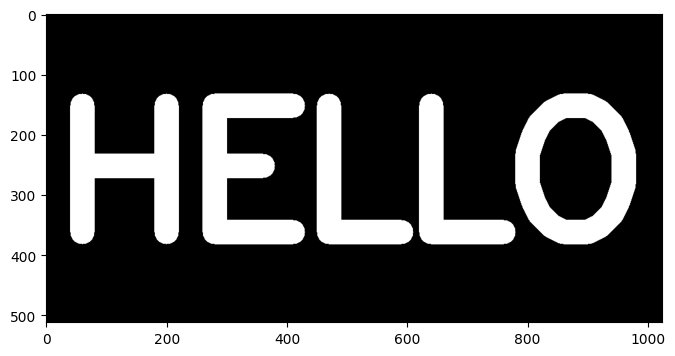

In [29]:
img = generate_img()
plt.figure(figsize=(8, 4))
plt.imshow(img, cmap="gray")
plt.show()

### **5.1. Erosion**

The basic idea of erosion is just like soil erosion only, it erodes away the boundaries of foreground object (Always try to keep foreground in white). So what it does? The kernel slides through the image (as in 2D convolution). A pixel in the original image (either 1 or 0) will be considered 1 only if all the pixels under the kernel is 1, otherwise it is eroded (made to zero). So what happends is that, all the pixels near boundary will be discarded depending upon the size of kernel. So the thickness or size of the foreground object decreases or simply white region decreases in the image. It is useful for removing small white noises.

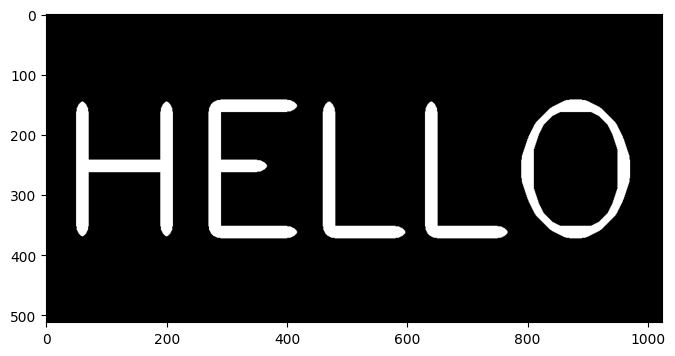

In [30]:
# Erosion.
kernel = np.ones((5, 5), np.uint8)
erosion = cv2.erode(img, kernel, iterations=5)
plt.figure(figsize=(8, 4))
plt.imshow(erosion, cmap="gray")
plt.show()

### **5.2. Dilation**

It is just opposite of erosion. Here, a pixel element is '1' if at least one pixel under the kernel is '1'. So it increases the white region in the image or size of foreground object increases. Normally, in cases like noise removal, erosion is followed by dilation. Because, erosion removes white noises, but it also shrinks our object. So we dilate it. Since noise is gone, they won't come back, but our object area increases. It is also useful in joining broken parts of an object.

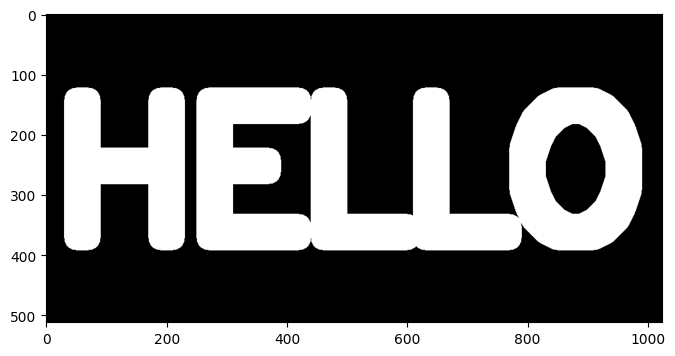

In [31]:
# Dilation.
kernel = np.ones((5, 5), np.uint8)
dilation = cv2.dilate(img, kernel, iterations=5)
plt.figure(figsize=(8, 4))
plt.imshow(dilation, cmap="gray")
plt.show()

### **5.3. Opening**

Opening is Erosion followed by Dilation. It is useful in removing noise.

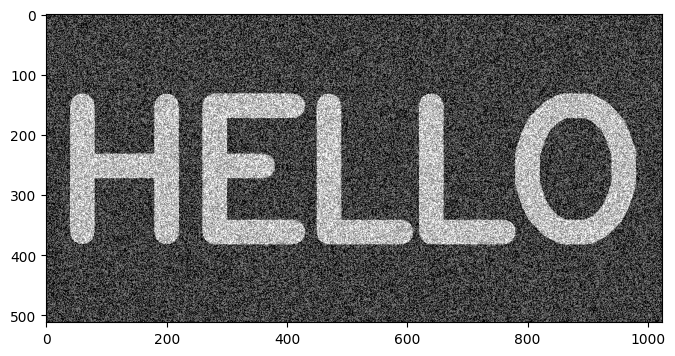

In [32]:
noise = np.random.randint(0, 2, size=(512, 1024)) * 127
noisy_img = np.array(img + noise, dtype=np.uint8)
plt.figure(figsize=(8, 4))
plt.imshow(noisy_img, cmap="gray")
plt.show()


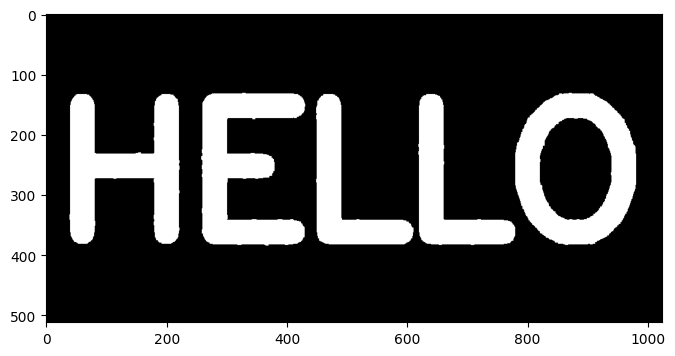

In [33]:
# Opening - erosion followed by dilation (useful in removing noise).
opening = cv2.morphologyEx(noisy_img, cv2.MORPH_OPEN, kernel)
plt.figure(figsize=(8, 4))
plt.imshow(opening, cmap="gray")
plt.show()

### **5.4. Closing**

Closing is reverse of Opening, Dilation followed by Erosion. It is useful in closing small holes inside the foreground objects, or small black points on the object.

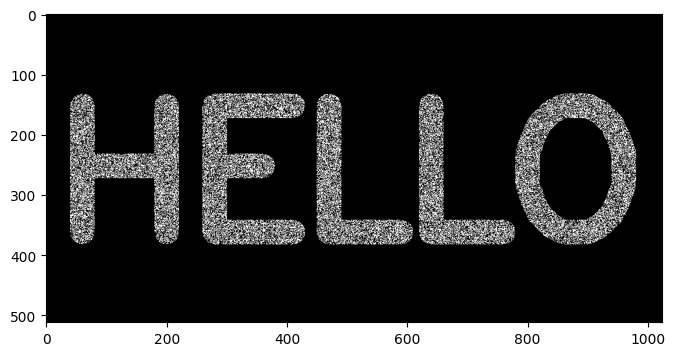

In [34]:
noise = np.random.randint(0, 2, size=(512, 1024)) * 127
noisy_img = np.array(img * noise, dtype=np.uint8)
plt.figure(figsize=(8, 4))
plt.imshow(noisy_img, cmap="gray")
plt.show()

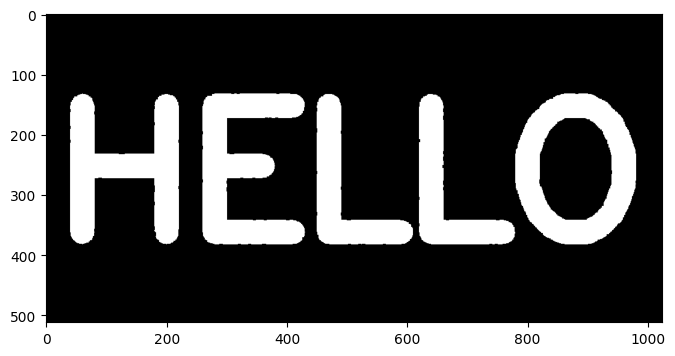

In [35]:
# Closing - dilation followed by erosion (useful in closing small holes).
opening = cv2.morphologyEx(noisy_img, cv2.MORPH_CLOSE, kernel)
plt.figure(figsize=(8, 4))
plt.imshow(opening, cmap="gray")
plt.show()

### **5.5. Gradient**

It is the difference between dilation and erosion of an image. The result will look like the outline of the object.

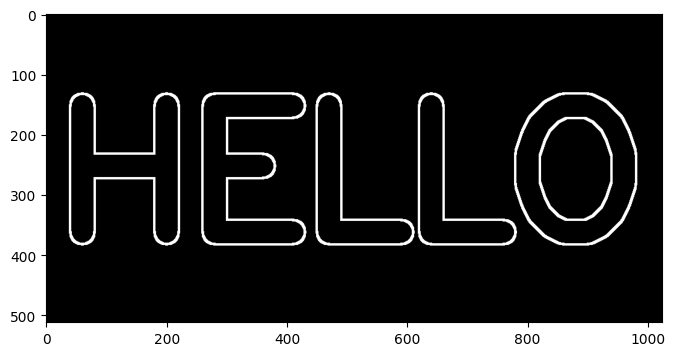

In [36]:
# Gradient - difference between dilation and erosion.
grad = cv2.morphologyEx(img, cv2.MORPH_GRADIENT, kernel)
plt.figure(figsize=(8, 4))
plt.imshow(grad, cmap="gray")
plt.show()

## **6. Gradients**

Image gradients is an extension of morphological operations. An image gradient is a directional change in the intensity or color in a image.

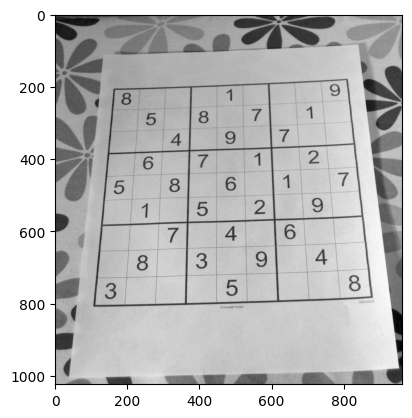

In [37]:
img = cv2.imread("./data/sudoku.jpg", cv2.IMREAD_GRAYSCALE)
plt.imshow(img, cmap="gray")
plt.show()

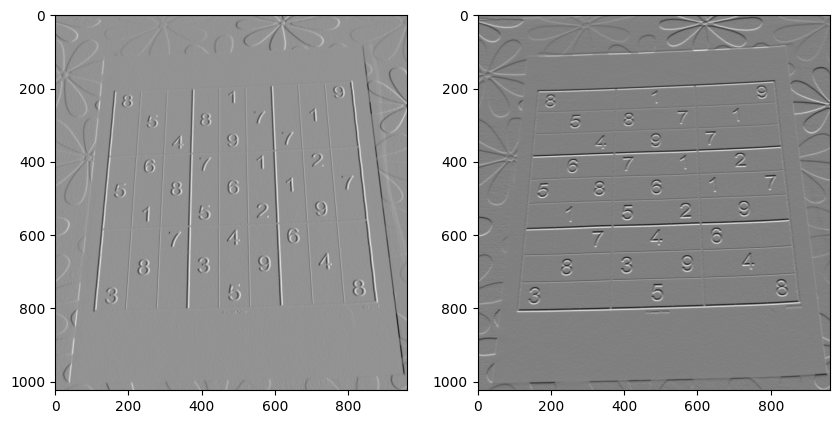

In [38]:
sobelx = cv2.Sobel(img, cv2.CV_64F, dx=1, dy=0, ksize=5)
sobely = cv2.Sobel(img, cv2.CV_64F, dx=0, dy=1, ksize=5)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
ax1.imshow(sobelx, cmap="gray")
ax2.imshow(sobely, cmap="gray")
plt.show()

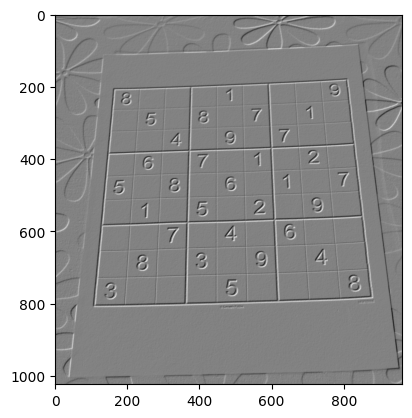

In [39]:
sobel_blend = cv2.addWeighted(sobelx, 0.5, sobely, 0.5, 0)
plt.imshow(sobel_blend, cmap="gray")
plt.show()

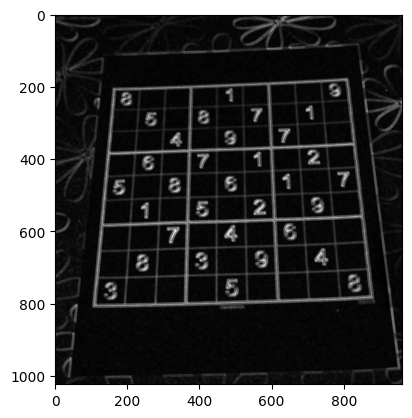

In [40]:
kernel = np.ones((5, 5), np.uint8)
gradient = cv2.morphologyEx(sobel_blend, cv2.MORPH_GRADIENT, kernel)
plt.imshow(gradient, cmap="gray")
plt.show()

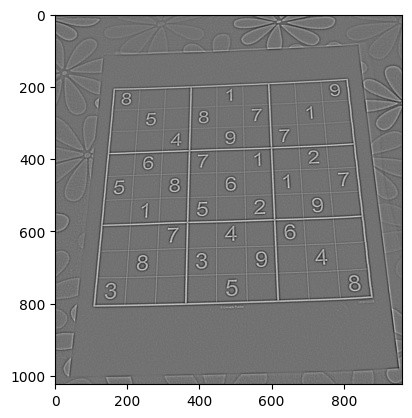

In [41]:
laplacian = cv2.Laplacian(img, cv2.CV_64F, ksize=11)
plt.imshow(laplacian, cmap="gray")
plt.show()

## **7. Histograms**

### **7.1. Basic Histogram**

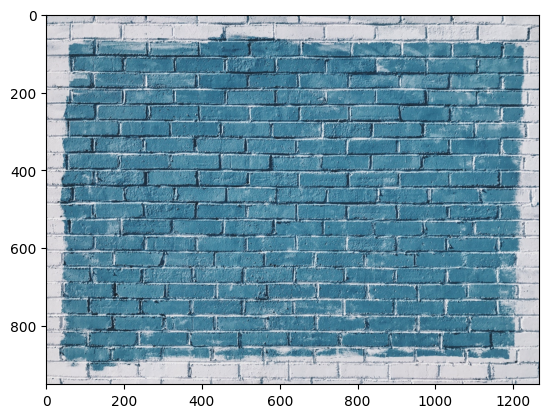

In [58]:
bricks = cv2.imread("./data/bricks.jpg")
plt.imshow(cv2.cvtColor(bricks, cv2.COLOR_BGR2RGB))
plt.show()

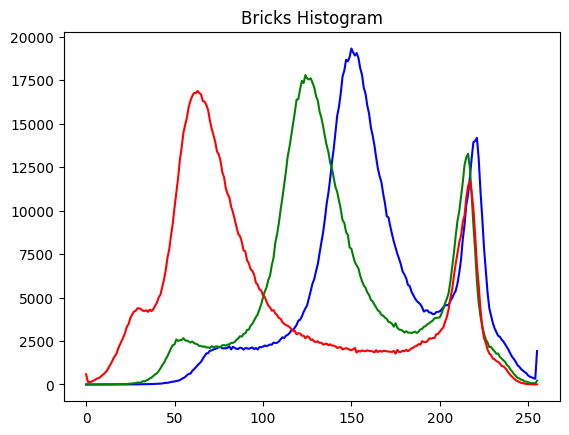

In [59]:
colors = ("b", "g", "r")

for i, color in enumerate(colors):
    hist = cv2.calcHist([bricks], channels=[i], mask=None, histSize=[256], ranges=[0, 256])
    plt.plot(hist, color=color)

plt.title("Bricks Histogram")
plt.show()

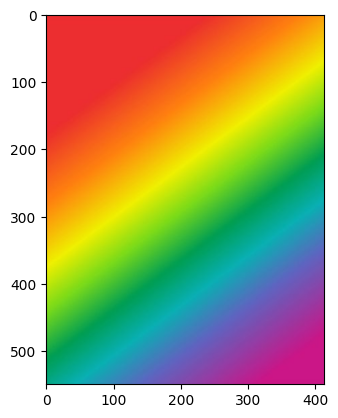

In [60]:
img = cv2.imread("./data/rainbow.jpg")
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.show()

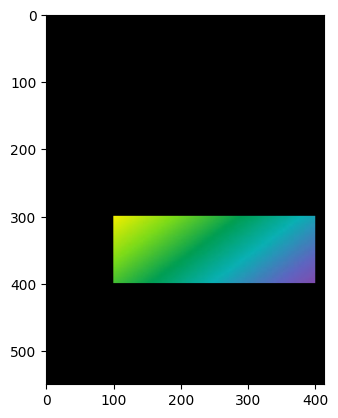

In [73]:
mask = np.zeros(img.shape[:2], np.uint8)
mask[300:400, 100:400] = 255
masked_img = cv2.bitwise_and(img, img, mask=mask)
plt.imshow(cv2.cvtColor(masked_img, cv2.COLOR_BGR2RGB))
plt.show()

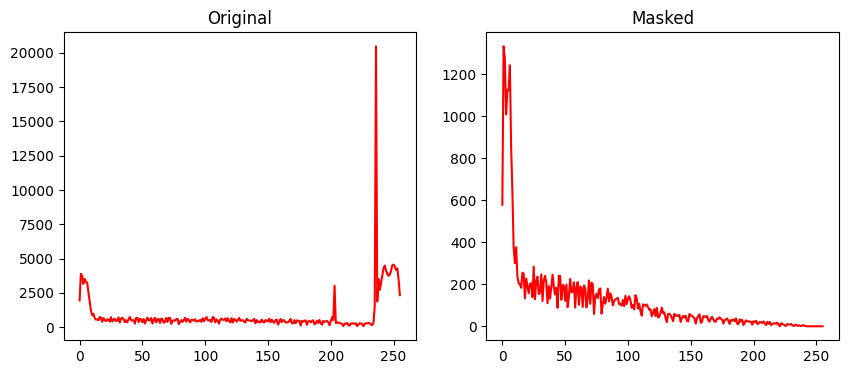

In [88]:
hist_red_masked = cv2.calcHist([img], channels=[2], mask=None, histSize=[256], ranges=[0, 256])
hist_red_origin = cv2.calcHist([img], channels=[2], mask=mask, histSize=[256], ranges=[0, 256])

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))
ax1.plot(hist_red_masked, color="r")
ax1.set_title("Original")
ax2.plot(hist_red_origin, color="r")
ax2.set_title("Masked")
plt.show()

### **7.2. Histogram Equalization**

Consider an image whose pixel values are confined to some specific range of values only. For eg, brighter image will have all pixels confined to high values. But a good image will have pixels from all regions of the image. So you need to stretch this histogram to either ends and that is what Histogram Equalization does (in simple words). This normally improves the contrast of the image.

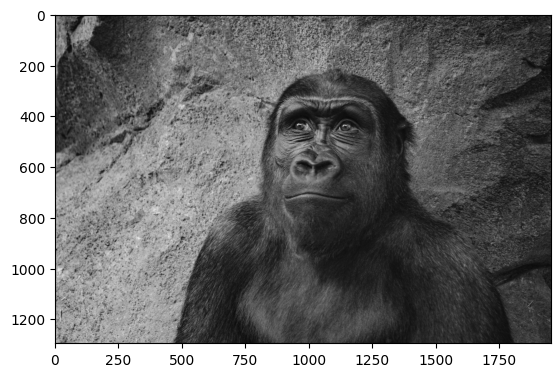

In [90]:
img = cv2.imread("./data/gorilla.jpg", cv2.IMREAD_GRAYSCALE)
plt.imshow(img, cmap="gray")
plt.show()

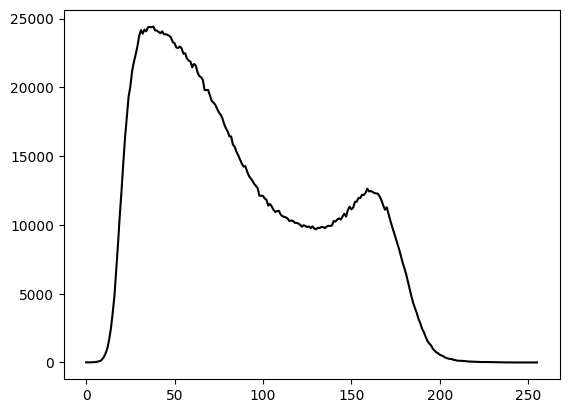

In [94]:
hist = cv2.calcHist([img], channels=[0], mask=None, histSize=[256], ranges=[0, 256])
plt.plot(hist, color="black")
plt.show()

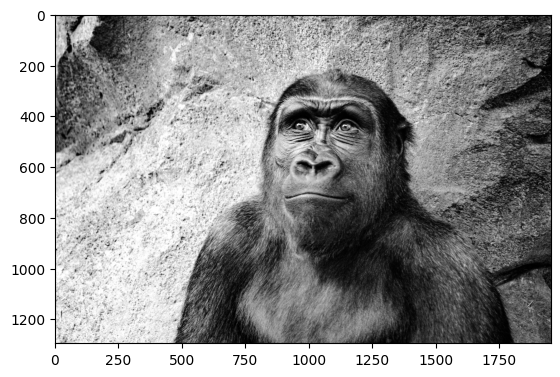

In [95]:
eq_img = cv2.equalizeHist(img)
plt.imshow(eq_img, cmap="gray")
plt.show()

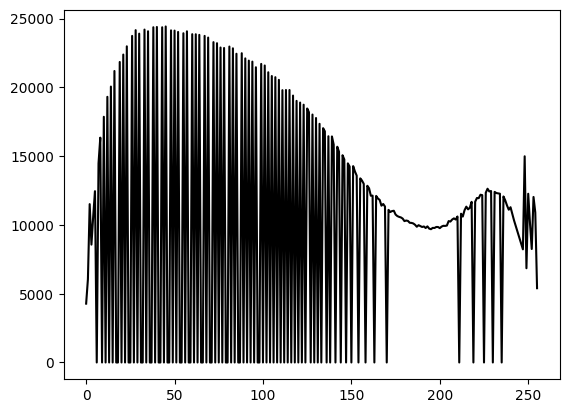

In [99]:
eq_hist = cv2.calcHist([eq_img], channels=[0], mask=None, histSize=[256], ranges=[0, 256])
plt.plot(eq_hist, color="black")
plt.show()

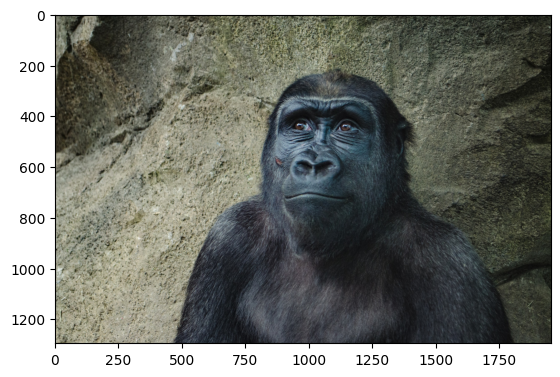

In [100]:
img = cv2.imread("./data/gorilla.jpg")
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.show()

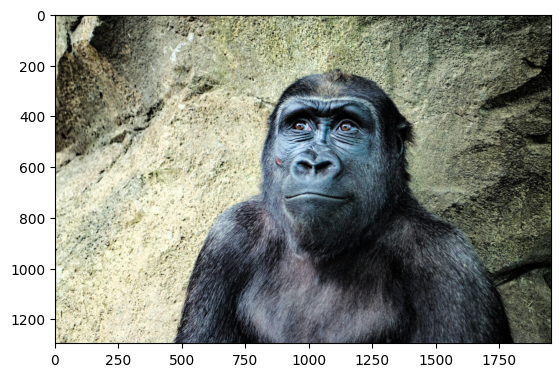

In [101]:
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
hsv[..., 2] = cv2.equalizeHist(hsv[..., 2])
plt.imshow(cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB))
plt.show()